In [2]:
# Importing libraries

import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import seaborn as sns
import pandas as pd
import pydicom as dicom
from skimage.transform import resize, rescale, rotate
import gdcm
import pylibjpeg
from scipy import ndimage
from skimage import morphology
import matplotlib.image as mpimage
from IPython.display import Image

import warnings

In [3]:
# Loading our image directory path

data_dir = "C:/Users/Administrator/Downloads/embolism/Pulmonary-embolism/PATIENT_DATA"
# data = "PATIENT_DATA"

data_dir

'C:/Users/Administrator/Downloads/embolism/Pulmonary-embolism/PATIENT_DATA'

In [4]:
# Loading our dicom image files
def load_dicom_images(data_dir):
    # Load filenames
    images = []
    
    for filename in os.listdir(data_dir):
        file_path = os.path.join(data_dir, filename)
        # Read dicom files
        ds = dicom.dcmread(file_path)
        images.append(ds)
    return images

In [5]:
# dicom_images = [dicom.dcmread(os.path.join(data_dir, filename))  for filename in os.listdir(data_dir)]

# print(dicom_images)

In [6]:
dicom_images = load_dicom_images(data_dir)
dicom_images


[Dataset.file_meta -------------------------------
 (0002, 0000) File Meta Information Group Length  UL: 204
 (0002, 0001) File Meta Information Version       OB: b'\x00\x01'
 (0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
 (0002, 0003) Media Storage SOP Instance UID      UI: 1.3.12.2.1107.5.1.4.39260.30000021121314344062500015739
 (0002, 0010) Transfer Syntax UID                 UI: JPEG Lossless, Non-Hierarchical (Process 14)
 (0002, 0012) Implementation Class UID            UI: 1.2.826.0.1.3680043.2.135.1066.101
 (0002, 0013) Implementation Version Name         SH: '1.5.0/WIN32'
 -------------------------------------------------
 (0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
 (0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'AXIAL', 'CT_SOM5 SPI']
 (0008, 0016) SOP Class UID                       UI: CT Image Storage
 (0008, 0018) SOP Instance UID                    UI: 1.3.12.2.1107.5.1.4.39260.30000021121314344

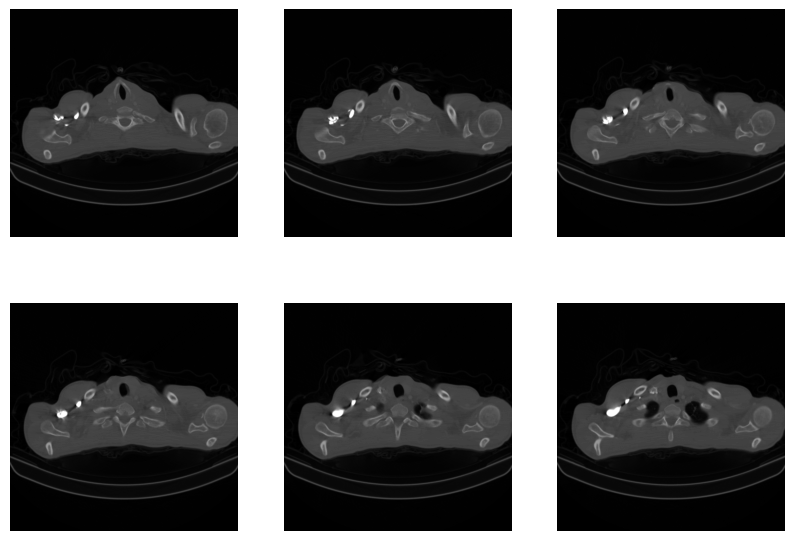

In [7]:
# Visualize a small subset of the images within the dataset

fig, axes = plt.subplots(2, 3, figsize = (10, 7))

for i in range(2):
    for j in range(3):
        axes[i, j].imshow(dicom_images[i * 3 + j].pixel_array, cmap='gray')
        axes[i, j].axis('off')
        
plt.show()

In [8]:
# Getting the pixel array of the first image

for image in dicom_images:
    print(image.pixel_array)
    break

[[24 27 27 ... 38 20 11]
 [12 11 25 ... 12 15 36]
 [39 15 11 ... 20 29 33]
 ...
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]]


In [9]:
# Generating image shape
